In [1]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [2]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
fatal: destination path 'detectron2' already exists and is not an empty directory.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your environment


In [4]:
!pip install torch torchvision

In [5]:
!pip install pyyaml

In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.6 ; cuda:  cu124
detectron2: 0.6


In [4]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [8]:
!curl -L "https://app.roboflow.com/ds/zLtdVRryeR?key=xyJqhMdhnq" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   902  100   902    0     0   1338      0 --:--:-- --:--:-- --:--:--  1338
 80 1701M   80 1370M    0     0  22.8M      0  0:01:14  0:01:00  0:00:14 22.8M^C


In [5]:
import json

def remove_first_category_and_shift(input_path, output_path):
    """
    Removes the first category from the COCO dataset and shifts all remaining category IDs down by 1.
    """
    with open(input_path, "r") as f:
        data = json.load(f)

    if not data["categories"]:
        print(f"⚠️ No categories found in {input_path}. Skipping.")
        return

    # Remove the first category
    removed_category = data["categories"][0]
    removed_id = removed_category["id"]

    print(f"🚀 Removing category: {removed_category['name']} (ID: {removed_id})")

    # Keep only the remaining categories and shift IDs down by 1
    filtered_categories = data["categories"][1:]
    id_mapping = {}  # Old ID -> New ID mapping

    for cat in filtered_categories:
        old_id = cat["id"]
        new_id = old_id - 1  # Shift IDs down
        cat["id"] = new_id
        id_mapping[old_id] = new_id

    # Update annotations
    filtered_annotations = [
        {**ann, "category_id": id_mapping[ann["category_id"]]}
        for ann in data["annotations"]
        if ann["category_id"] in id_mapping
    ]

    # Save updated JSON
    data["categories"] = filtered_categories
    data["annotations"] = filtered_annotations

    with open(output_path, "w") as f:
        json.dump(data, f, indent=4)

    print(f"✅ Fixed and saved: {output_path}")

# Paths for dataset annotations
datasets = {
    "train": "/content/train/_annotations.coco.json",
    "valid": "/content/valid/_annotations.coco.json",
    "test": "/content/test/_annotations.coco.json",
}

# Process each dataset
for split, path in datasets.items():
    fixed_path = path.replace("_annotations", "fixed_annotations")
    remove_first_category_and_shift(path, fixed_path)

print("🎯 All datasets have been processed successfully!")


🚀 Removing category: military-objects (ID: 0)
✅ Fixed and saved: /content/train/fixed_annotations.coco.json
🚀 Removing category: military-objects (ID: 0)
✅ Fixed and saved: /content/valid/fixed_annotations.coco.json
🚀 Removing category: military-objects (ID: 0)
✅ Fixed and saved: /content/test/fixed_annotations.coco.json
🎯 All datasets have been processed successfully!


In [6]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/fixed_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/fixed_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/fixed_annotations.coco.json", "/content/test")

WARNING [03/30 12:28:06 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/30 12:28:06 d2.data.datasets.coco]: Loaded 9752 images in COCO format from /content/train/fixed_annotations.coco.json


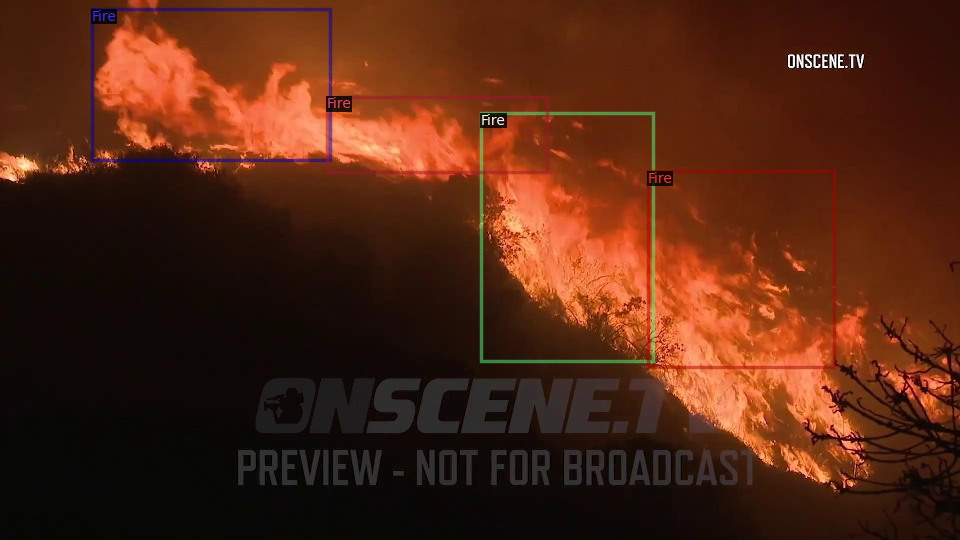

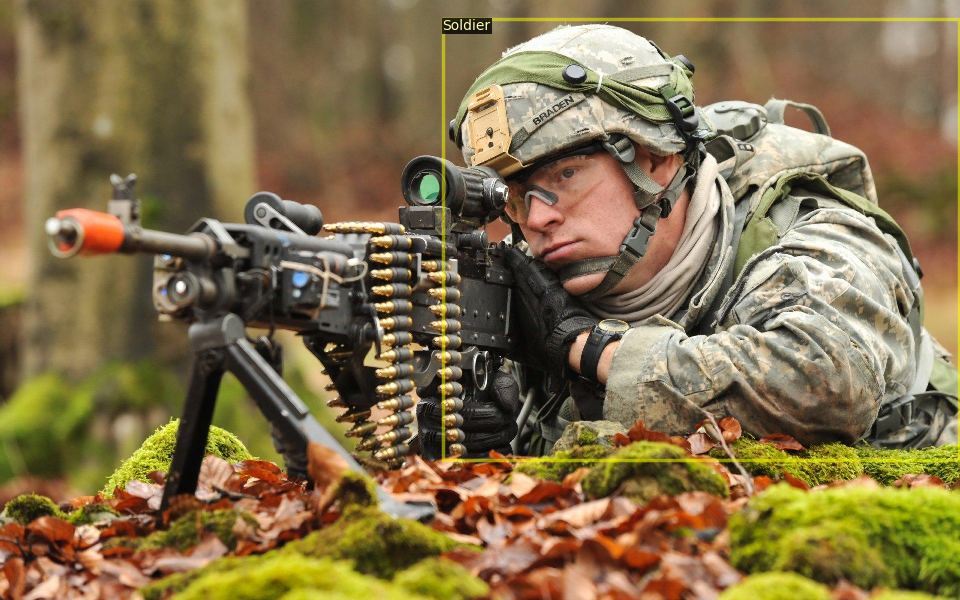

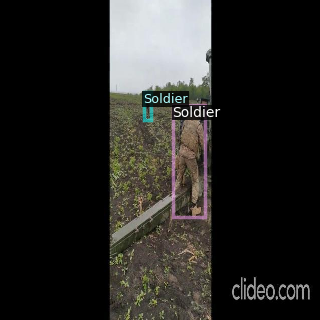

In [7]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [8]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [10]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_test",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1400)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 13
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

cfg.TEST.EVAL_PERIOD = 500
cfg.MODEL.MASK_ON = False  # Ensure the model does not expect masks


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

[03/30 12:28:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[03/30 12:28:32 d2.engine.hooks]: Loading scheduler from state_dict ...
[03/30 12:28:32 d2.engine.train_loop]: Starting training from iteration 350


/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/30 12:29:09 d2.utils.events]:  eta: 1:05:51  iter: 359  total_loss: 1.713  loss_cls: 0.7679  loss_box_reg: 0.7613  loss_rpn_cls: 0.04683  loss_rpn_loc: 0.02807    time: 3.5956  last_time: 3.8908  data_time: 0.0605  last_data_time: 0.0558   lr: 1.8591e-05  max_mem: 10534M
[03/30 12:30:25 d2.utils.events]:  eta: 1:06:02  iter: 379  total_loss: 1.602  loss_cls: 0.7523  loss_box_reg: 0.7492  loss_rpn_cls: 0.026  loss_rpn_loc: 0.01705    time: 3.5865  last_time: 2.9927  data_time: 0.0357  last_data_time: 0.0169   lr: 1.9571e-05  max_mem: 10534M
[03/30 12:31:36 d2.utils.events]:  eta: 1:06:28  iter: 399  total_loss: 1.718  loss_cls: 0.8249  loss_box_reg: 0.8312  loss_rpn_cls: 0.01995  loss_rpn_loc: 0.01322    time: 3.5850  last_time: 3.0094  data_time: 0.0334  last_data_time: 0.0326   lr: 2.0551e-05  max_mem: 10534M
[03/30 12:32:47 d2.utils.events]:  eta: 1:03:37  iter: 419  total_loss: 1.664  loss_cls: 0.7814  loss_box_reg: 0.7809  loss_rpn_cls: 0.02239  loss_rpn_loc: 0.01683    time: 3

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[03/30 12:37:31 d2.evaluation.evaluator]: Inference done 11/154. Dataloading: 0.0014 s/iter. Inference: 0.2252 s/iter. Eval: 0.0005 s/iter. Total: 0.2270 s/iter. ETA=0:00:32
[03/30 12:37:36 d2.evaluation.evaluator]: Inference done 33/154. Dataloading: 0.0022 s/iter. Inference: 0.2343 s/iter. Eval: 0.0004 s/iter. Total: 0.2369 s/iter. ETA=0:00:28
[03/30 12:37:42 d2.evaluation.evaluator]: Inference done 54/154. Dataloading: 0.0040 s/iter. Inference: 0.2378 s/iter. Eval: 0.0004 s/iter. Total: 0.2423 s/iter. ETA=0:00:24
[03/30 12:37:47 d2.evaluation.evaluator]: Inference done 77/154. Dataloading: 0.0035 s/iter. Inference: 0.2327 s/iter. Eval: 0.0004 s/iter. Total: 0.2367 s/iter. ETA=0:00:18
[03/30 12:37:52 d2.evaluation.evaluator]: Inference done 99/154. Dataloading: 0.0039 s/iter. Inference: 0.2308 s/iter. Eval: 0.0004 s/iter. Total: 0.2352 s/iter. ETA=0:00:12
[03/30 12:37:57 d2.evaluation.evaluator]: Inference done 122/154. Dataloading: 0.0037 s/iter. Inference: 0.2289 s/iter. Eval: 0.00

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[03/30 13:07:32 d2.evaluation.evaluator]: Inference done 11/154. Dataloading: 0.0026 s/iter. Inference: 0.2243 s/iter. Eval: 0.0004 s/iter. Total: 0.2273 s/iter. ETA=0:00:32
[03/30 13:07:37 d2.evaluation.evaluator]: Inference done 32/154. Dataloading: 0.0043 s/iter. Inference: 0.2332 s/iter. Eval: 0.0005 s/iter. Total: 0.2382 s/iter. ETA=0:00:29
[03/30 13:07:43 d2.evaluation.evaluator]: Inference done 53/154. Dataloading: 0.0038 s/iter. Inference: 0.2361 s/iter. Eval: 0.0004 s/iter. Total: 0.2405 s/iter. ETA=0:00:24
[03/30 13:07:48 d2.evaluation.evaluator]: Inference done 76/154. Dataloading: 0.0039 s/iter. Inference: 0.2325 s/iter. Eval: 0.0004 s/iter. Total: 0.2370 s/iter. ETA=0:00:18
[03/30 13:07:53 d2.evaluation.evaluator]: Inference done 98/154. Dataloading: 0.0036 s/iter. Inference: 0.2314 s/iter. Eval: 0.0004 s/iter. Total: 0.2356 s/iter. ETA=0:00:13
[03/30 13:07:58 d2.evaluation.evaluator]: Inference done 121/154. Dataloading: 0.0033 s/iter. Inference: 0.2291 s/iter. Eval: 0.00

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[03/30 13:37:52 d2.evaluation.evaluator]: Inference done 11/154. Dataloading: 0.0013 s/iter. Inference: 0.2213 s/iter. Eval: 0.0004 s/iter. Total: 0.2230 s/iter. ETA=0:00:31
[03/30 13:37:57 d2.evaluation.evaluator]: Inference done 33/154. Dataloading: 0.0016 s/iter. Inference: 0.2317 s/iter. Eval: 0.0004 s/iter. Total: 0.2338 s/iter. ETA=0:00:28
[03/30 13:38:02 d2.evaluation.evaluator]: Inference done 53/154. Dataloading: 0.0039 s/iter. Inference: 0.2363 s/iter. Eval: 0.0005 s/iter. Total: 0.2409 s/iter. ETA=0:00:24
[03/30 13:38:07 d2.evaluation.evaluator]: Inference done 76/154. Dataloading: 0.0033 s/iter. Inference: 0.2323 s/iter. Eval: 0.0005 s/iter. Total: 0.2363 s/iter. ETA=0:00:18
[03/30 13:38:12 d2.evaluation.evaluator]: Inference done 98/154. Dataloading: 0.0033 s/iter. Inference: 0.2322 s/iter. Eval: 0.0005 s/iter. Total: 0.2362 s/iter. ETA=0:00:13
[03/30 13:38:17 d2.evaluation.evaluator]: Inference done 120/154. Dataloading: 0.0034 s/iter. Inference: 0.2311 s/iter. Eval: 0.00

# Evaluation

In [11]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [12]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/30 13:40:48 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [13]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[03/30 13:40:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[03/30 13:40:55 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/30 13:40:55 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [03/30 13:40:55 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/30 13:40:55 d2.data.datasets.coco]: Loaded 154 images in COCO format from /content/test/fixed_annotations.coco.json
[03/30 13:40:55 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/30 13:40:55 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/30 13:40:55 d2.data.common]: Serializin

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


[03/30 13:40:58 d2.evaluation.evaluator]: Inference done 11/154. Dataloading: 0.0015 s/iter. Inference: 0.2212 s/iter. Eval: 0.0004 s/iter. Total: 0.2231 s/iter. ETA=0:00:31
[03/30 13:41:03 d2.evaluation.evaluator]: Inference done 33/154. Dataloading: 0.0017 s/iter. Inference: 0.2318 s/iter. Eval: 0.0004 s/iter. Total: 0.2340 s/iter. ETA=0:00:28
[03/30 13:41:08 d2.evaluation.evaluator]: Inference done 53/154. Dataloading: 0.0042 s/iter. Inference: 0.2362 s/iter. Eval: 0.0005 s/iter. Total: 0.2411 s/iter. ETA=0:00:24
[03/30 13:41:14 d2.evaluation.evaluator]: Inference done 76/154. Dataloading: 0.0035 s/iter. Inference: 0.2326 s/iter. Eval: 0.0005 s/iter. Total: 0.2366 s/iter. ETA=0:00:18
[03/30 13:41:19 d2.evaluation.evaluator]: Inference done 98/154. Dataloading: 0.0036 s/iter. Inference: 0.2324 s/iter. Eval: 0.0005 s/iter. Total: 0.2365 s/iter. ETA=0:00:13
[03/30 13:41:24 d2.evaluation.evaluator]: Inference done 120/154. Dataloading: 0.0040 s/iter. Inference: 0.2318 s/iter. Eval: 0.00

OrderedDict([('bbox',
              {'AP': 11.694783348668668,
               'AP50': 27.040059502407054,
               'AP75': 7.8850216715342505,
               'APs': 6.145818823723608,
               'APm': 8.237590212328238,
               'APl': 16.70027205219794,
               'AP-Aircraft': 11.165117365283495,
               'AP-Camouflage': 8.996684478416348,
               'AP-Drone': 2.4075579199711017,
               'AP-Fire': 3.337156357524308,
               'AP-Grenade': 33.74703311646645,
               'AP-Hand-Gun': 22.772924803792595,
               'AP-Knife': 21.93480511233584,
               'AP-Military-Vehicle': 18.603741177199474,
               'AP-Missile': 0.0,
               'AP-Pistol': 7.72094312905469,
               'AP-Rifle': 5.076529641734521,
               'AP-Smoke': 0.0,
               'AP-Soldier': 16.26969043091385})])

In [14]:
import torch
import time
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.model_zoo import get_config_file
from detectron2.modeling import build_model
from sklearn.metrics import confusion_matrix, classification_report

# Load trained model configuration
cfg = get_cfg()
cfg.merge_from_file(get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TEST = ("my_dataset_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Load trained model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # Set threshold for inference
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 13
cfg.MODEL.MASK_ON = False  # Ensure masks are off

predictor = DefaultPredictor(cfg)

# Test evaluation with updated threshold (0.85)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)

# Evaluate using COCOEvaluator
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "my_dataset_test")
results = inference_on_dataset(predictor.model, test_loader, evaluator)
print("📊 Model Evaluation Metrics:\n", results)

# Extract mAP@50 and mAP@75
mAP_50 = results["bbox"]["AP50"]
mAP_75 = results["bbox"]["AP75"]

print(f"🎯 mAP@50: {mAP_50:.2f}")
print(f"🎯 mAP@75: {mAP_75:.2f}")

# Compute confusion matrix and inference time
gt_labels = []
pred_labels = []
inference_times = []

for batch in test_loader:
    for sample in batch:
        image = sample["image"].cpu().numpy()  # Convert tensor to NumPy array

        # Convert to uint8 format (0-255) if needed
        image = (image - image.min()) / (image.max() - image.min()) * 255
        image = image.astype(np.uint8)
        image = np.transpose(image, (1, 2, 0))  # Convert from (C, H, W) to (H, W, C)

        start_time = time.time()  # Start inference timing
        outputs = predictor(image)
        end_time = time.time()  # End timing

        inference_times.append(end_time - start_time)  # Store inference time

        instances = outputs["instances"]
        if len(instances) > 0:
            gt_labels.extend(sample["instances"].gt_classes.cpu().numpy())
            pred_labels.extend(instances.pred_classes.cpu().numpy())

# Compute average inference time
avg_inference_time = np.mean(inference_times)
print(f"\n⏱️ Average Inference Time per Image: {avg_inference_time:.4f} seconds")

# Compute the confusion matrix
conf_matrix = confusion_matrix(gt_labels, pred_labels, labels=list(range(cfg.MODEL.ROI_HEADS.NUM_CLASSES)))
print("\n🔍 Confusion Matrix:\n", conf_matrix)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(np.arange(cfg.MODEL.ROI_HEADS.NUM_CLASSES), np.arange(cfg.MODEL.ROI_HEADS.NUM_CLASSES))
plt.yticks(np.arange(cfg.MODEL.ROI_HEADS.NUM_CLASSES), np.arange(cfg.MODEL.ROI_HEADS.NUM_CLASSES))

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Generate per-class accuracy and overall accuracy
class_accuracy = conf_matrix.diagonal() / conf_matrix.sum(axis=1)
overall_accuracy = np.sum(conf_matrix.diagonal()) / np.sum(conf_matrix)

print("\n📌 Per-Class Accuracy:\n", class_accuracy)
print(f"\n✅ Overall Model Accuracy: {overall_accuracy:.2f}")

# Compute number of model parameters
model = build_model(cfg)
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"\n🖥️ Total Parameters: {total_params:,}")
print(f"🎯 Trainable Parameters: {trainable_params:,}")

[03/30 13:41:44 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[03/30 13:41:48 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[03/30 13:41:49 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/30 13:41:49 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [03/30 13:41:49 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/30 13:41:49 d2.data.datasets.coco]: Loaded 154 images in COCO format from /content/test/fixed_annotations.coco.json
[03/30 13:41:49 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/30 13:41:49 d2.data.common]: Serializi

KeyError: 'instances'


⏱️ Average Inference Time per Image: 0.2848 seconds

🔍 Confusion Matrix:
 [[0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0]]


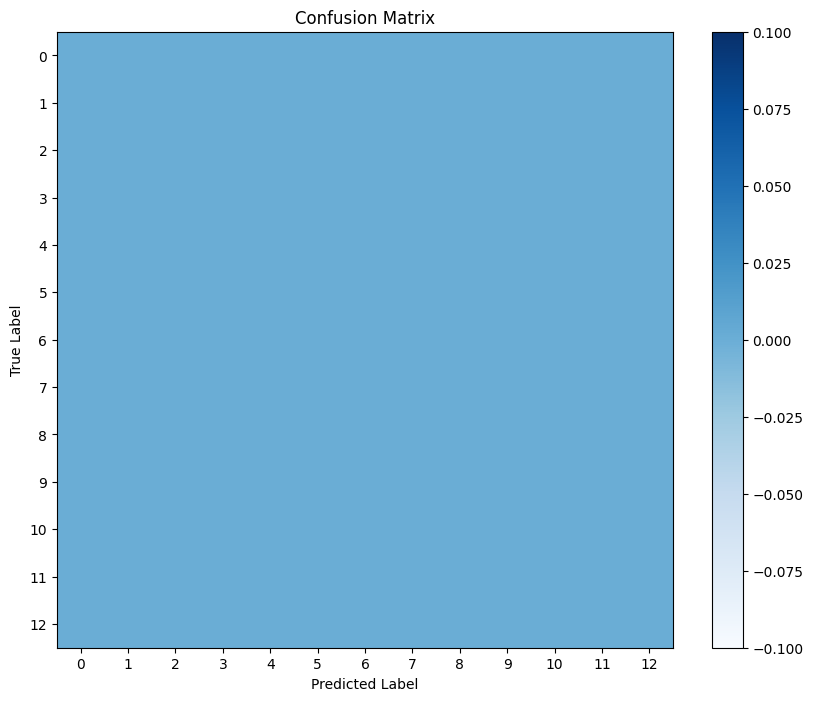

<ipython-input-16-70a5a3c63514>:22: RuntimeWarning: invalid value encountered in divide
  class_accuracy = conf_matrix.diagonal() / conf_matrix.sum(axis=1)
<ipython-input-16-70a5a3c63514>:23: RuntimeWarning: invalid value encountered in scalar divide
  overall_accuracy = np.sum(conf_matrix.diagonal()) / np.sum(conf_matrix)



📌 Per-Class Accuracy:
 [nan nan nan nan nan nan nan nan nan nan nan nan nan]

✅ Overall Model Accuracy: nan

🖥️ Total Parameters: 104,441,105
🎯 Trainable Parameters: 104,015,953


In [16]:

# Compute average inference time
avg_inference_time = np.mean(inference_times)
print(f"\n⏱️ Average Inference Time per Image: {avg_inference_time:.4f} seconds")

# Compute the confusion matrix
conf_matrix = confusion_matrix(gt_labels, pred_labels, labels=list(range(cfg.MODEL.ROI_HEADS.NUM_CLASSES)))
print("\n🔍 Confusion Matrix:\n", conf_matrix)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.colorbar()
plt.xticks(np.arange(cfg.MODEL.ROI_HEADS.NUM_CLASSES), np.arange(cfg.MODEL.ROI_HEADS.NUM_CLASSES))
plt.yticks(np.arange(cfg.MODEL.ROI_HEADS.NUM_CLASSES), np.arange(cfg.MODEL.ROI_HEADS.NUM_CLASSES))

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Generate per-class accuracy and overall accuracy
class_accuracy = conf_matrix.diagonal() / conf_matrix.sum(axis=1)
overall_accuracy = np.sum(conf_matrix.diagonal()) / np.sum(conf_matrix)

print("\n📌 Per-Class Accuracy:\n", class_accuracy)
print(f"\n✅ Overall Model Accuracy: {overall_accuracy:.2f}")

# Compute number of model parameters
model = build_model(cfg)
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"\n🖥️ Total Parameters: {total_params:,}")
print(f"🎯 Trainable Parameters: {trainable_params:,}")

In [17]:
import os
import cv2
import glob
import torch
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.engine import DefaultPredictor
from detectron2.data import MetadataCatalog

# Load model configuration and weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test",)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # Testing threshold

# Initialize predictor
predictor = DefaultPredictor(cfg)

# Set up evaluator for accuracy metrics
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "my_dataset_test")
results = inference_on_dataset(predictor.model, test_loader, evaluator)

# Extract and print mAP scores
mAP = results["bbox"]["AP"]
print(f"Average Precision (mAP) at IoU=0.5: {results['bbox']['AP50']:.2f}")
print(f"Average Precision (mAP) at IoU=0.75: {results['bbox']['AP75']:.2f}")
print(f"Mean Average Precision (mAP): {mAP:.2f}")


[03/30 13:46:56 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[03/30 13:46:56 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/30 13:46:56 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [03/30 13:46:56 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/30 13:46:56 d2.data.datasets.coco]: Loaded 154 images in COCO format from /content/test/fixed_annotations.coco.json
[03/30 13:46:56 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/30 13:46:56 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/30 13:46:56 d2.data.common]: Serializin